In [1]:
import numpy as np
import pandas as pd
import requests
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
from collections import Counter
import datetime
from dateutil.parser import parse
from datetime import datetime
from dateutil.relativedelta import relativedelta

In [2]:
df = pd.read_csv('invitro_train.csv')
df['Дата взятия'] = pd.to_datetime(df['Дата взятия'])
df

,Имя теста,Код теста,Значение,Регион,Дата взятия
0,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-25 06:02:00
1,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:04:00
2,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:04:00
3,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:14:00
4,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:14:00
...,...,...,...,...,...
308540,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Воронежская обл,2021-05-16 09:37:00
308541,Borrelia burgdorferi s.l (кач) ДНК,27Д,НЕ ОБНАР,Москва,2021-05-16 09:26:00
308542,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Москва,2021-05-16 09:26:00
308543,Borrelia burgdorferi s.l (кач) ДНК,27Д,НЕ ОБНАР,Москва,2021-05-17 12:00:00


In [3]:
set(df['Значение'].values)

{'Detected',
 'Is not detected',
 'Б/П',
 'НЕ ОБНАР',
 'ОБНАРУЖ',
 'ОБНАРУЖ.',
 'СМ. КОММ',
 'СМ.КОММ.'}

In [4]:
set(df['Имя теста'])

{'Anaplasma Phagocytophillum(кач) ДНК',
 'Borrelia burgdorferi s.l (кач) ДНК',
 'Borrelia miyamotoi (кач) ДНК',
 'Ehrlichia muris/chaffeеnsis(кач) ДНК',
 'Вирус клещевого энцефалита(кач) РНК'}

In [5]:
df['Код теста'] = [v.replace(' ', '') for v in df['Код теста'].values]

In [6]:
set(df['Код теста'])

{'27Д', '34Д', '35Д', '36Д', '39Д'}

In [7]:
# df['pos'] = []

In [8]:
df['Значение']

0         ОБНАРУЖ.
1         ОБНАРУЖ.
2         НЕ ОБНАР
3         ОБНАРУЖ.
4         НЕ ОБНАР
            ...   
308540    НЕ ОБНАР
308541    НЕ ОБНАР
308542    НЕ ОБНАР
308543    НЕ ОБНАР
308544    НЕ ОБНАР
Name: Значение, Length: 308545, dtype: object

In [9]:
cnt = Counter(df['Значение'].values)

In [10]:
sum(cnt.values())

308545

In [11]:
32000/308545

0.10371258649467663

In [12]:
df['pos'] = [1 if (val in ('ОБНАРУЖ', 'ОБНАРУЖ.')) else 0 for val in df['Значение'].values]

In [13]:
df['pos'].values.mean()

0.10388436046605844

In [14]:
region_tests = df.groupby(['Регион']).count().reset_index()

In [15]:
# chel_df['date'] = pd.to_datetime(chel_df['Дата взятия'])
df['date'] = pd.to_datetime(df['Дата взятия'])

In [16]:
df['date'].values[0]

numpy.datetime64('2019-05-25T06:02:00.000000000')

In [17]:
df['date'] = df['date'].dt.date

In [18]:
df['date'] = pd.to_datetime(df['date'])

In [19]:
chel_df = df[ df['Регион'] == 'Челябинская обл ' ]

In [20]:
pos = chel_df[ chel_df['pos'] == 1 ]

In [21]:
pos_gb = pos.groupby('date').count().reset_index()
full_gb = chel_df.groupby('date').count().reset_index()

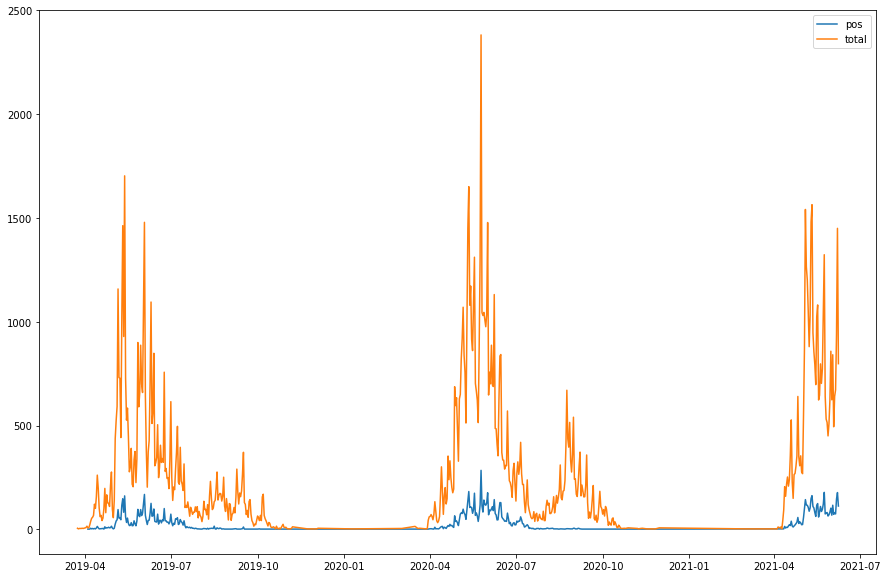

In [22]:
plt.figure(figsize=(15, 10))
plt.plot(pos_gb['date'], pos_gb['pos'], label='pos')
plt.plot(full_gb['date'], full_gb['pos'], label='total')
plt.legend()

## Смотрим айдишники людей и кто как покупает

In [23]:
from tqdm import tqdm

In [24]:
region_dt_keys = []

for idx, row in tqdm(df[['Регион', 'Дата взятия']].iterrows()):
    region_dt_keys.append(tuple(row.values))

308545it [00:22, 13505.85it/s]


In [25]:
region_dt_keys_distinct = set(region_dt_keys)

In [26]:
dt_reg2id = {v:i for i, v in enumerate(region_dt_keys_distinct)}

In [27]:
dt_reg2id

{('Тульская обл', Timestamp('2021-05-06 12:02:00')): 0,
 ('Москва', Timestamp('2019-07-31 08:10:00')): 1,
 ('Челябинская обл ', Timestamp('2020-05-31 15:23:00')): 2,
 ('Челябинская обл ', Timestamp('2019-05-29 05:50:00')): 3,
 ('Челябинская обл ', Timestamp('2020-06-03 09:06:00')): 4,
 ('Курганская обл', Timestamp('2019-07-31 08:11:00')): 5,
 ('Калининградская обл', Timestamp('2020-06-14 10:55:00')): 6,
 ('Московская область', Timestamp('2019-09-07 17:02:00')): 7,
 ('Челябинская обл ', Timestamp('2020-07-10 13:37:00')): 8,
 ('Челябинская обл ', Timestamp('2020-06-04 06:25:00')): 9,
 ('Свердловская обл', Timestamp('2020-05-13 08:55:00')): 10,
 ('Челябинская обл ', Timestamp('2021-06-07 15:19:00')): 11,
 ('Челябинская обл ', Timestamp('2020-06-14 08:55:00')): 12,
 ('Челябинская обл ', Timestamp('2021-05-15 08:30:00')): 13,
 ('Свердловская обл', Timestamp('2019-06-28 11:02:00')): 14,
 ('Челябинская обл ', Timestamp('2021-05-18 09:55:00')): 15,
 ('Челябинская обл ', Timestamp('2021-05-11 1

In [28]:
# all_datetimes = df['Дата взятия']# df[['Дата взятия']].groupby('Дата взятия').count().reset_index()

In [29]:
df['id'] = df.apply(lambda x : dt_reg2id[(x[3], x[4])], axis=1)

In [30]:
df.head()

,Имя теста,Код теста,Значение,Регион,Дата взятия,pos,date,id
0,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-25 06:02:00,1,2019-05-25,76970
1,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:04:00,1,2019-05-27,48688
2,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:04:00,0,2019-05-27,48688
3,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:14:00,1,2019-05-27,80712
4,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:14:00,0,2019-05-27,80712


In [119]:
df.shape

(308545, 8)

In [31]:
id2tests = {}

for idx, id_ in tqdm(enumerate(df['id'].values)):
    code = df['Код теста'].values[idx]
    
    if id_ in id2tests:
        id2tests[id_].append(code)
    else:
        id2tests[id_] = [code]

308545it [00:00, 370558.31it/s]


In [32]:
possible_test_combinations = list(id2tests.values())

In [33]:
possible_test_combinations = [tuple(sorted(set(l))) for l in possible_test_combinations]

In [34]:
possible_comb_cnt = Counter(possible_test_combinations)

In [35]:
possible_comb_cnt.most_common(23)

[(('27Д', '35Д'), 44787),
 (('27Д', '34Д', '35Д', '39Д'), 20527),
 (('27Д', '34Д', '35Д', '36Д', '39Д'), 18215),
 (('35Д',), 1368),
 (('27Д',), 1054),
 (('27Д', '35Д', '36Д'), 577),
 (('34Д', '39Д'), 183),
 (('27Д', '36Д'), 94),
 (('36Д',), 67),
 (('34Д', '36Д', '39Д'), 58),
 (('27Д', '34Д', '39Д'), 33),
 (('35Д', '36Д'), 26),
 (('34Д', '35Д', '36Д', '39Д'), 7),
 (('27Д', '34Д', '35Д'), 4),
 (('27Д', '34Д', '35Д', '36Д'), 4),
 (('34Д', '35Д', '39Д'), 3),
 (('27Д', '35Д', '39Д'), 3),
 (('34Д', '36Д'), 1),
 (('35Д', '39Д'), 1),
 (('34Д', '35Д'), 1),
 (('27Д', '34Д', '36Д', '39Д'), 1),
 (('34Д',), 1),
 (('27Д', '39Д'), 1)]

## Дальше рисуем графики

In [37]:
cnt_regions = Counter(df['Регион'].values)

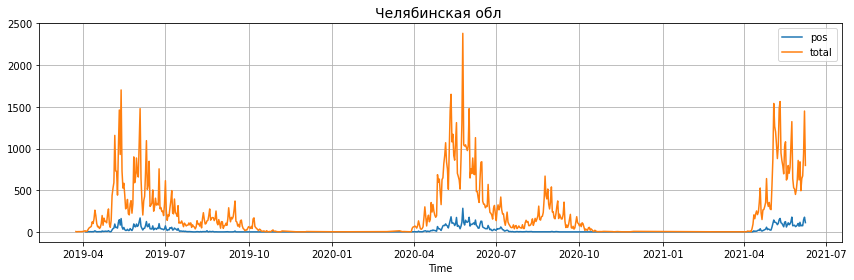

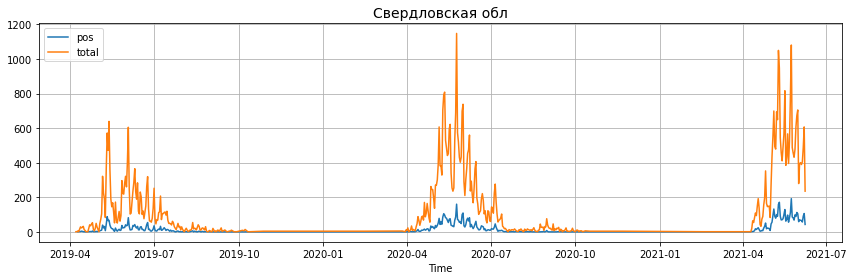

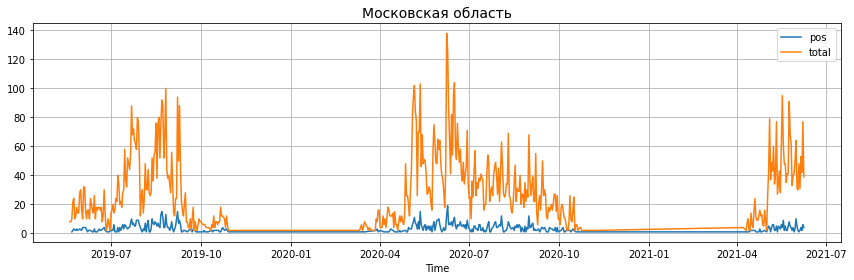

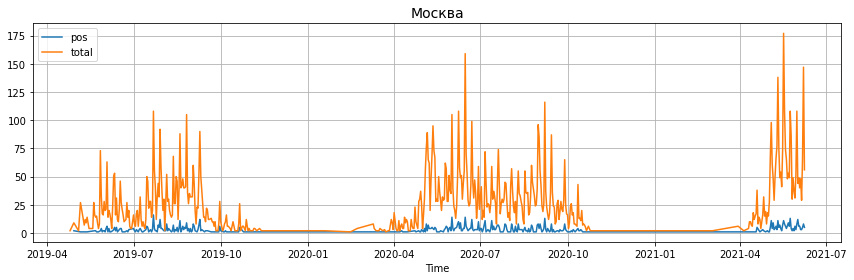

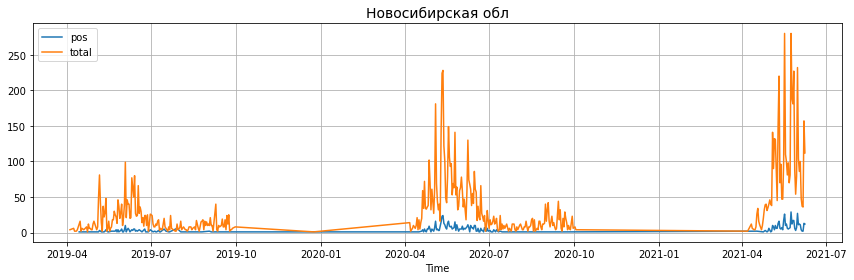

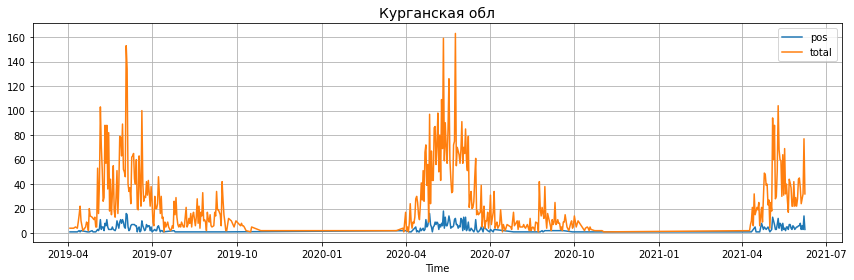

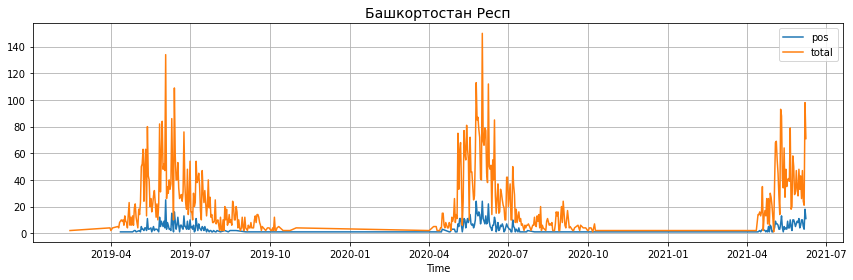

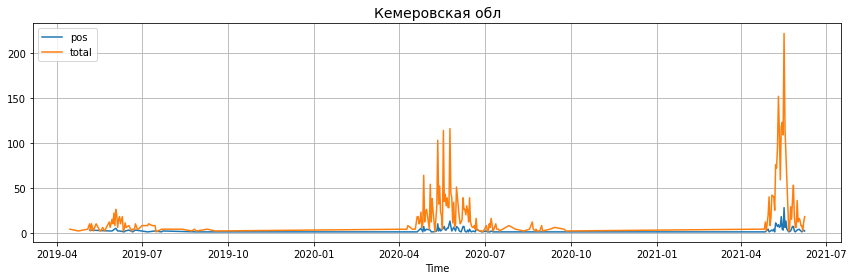

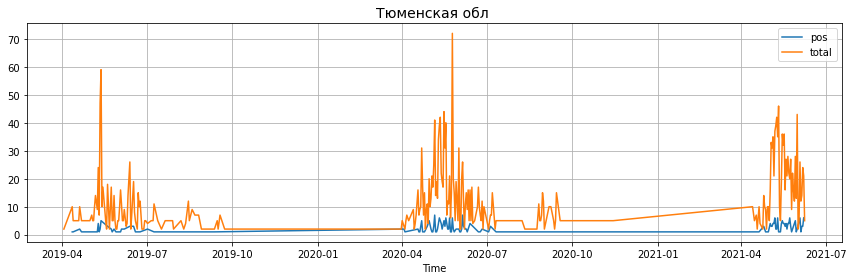

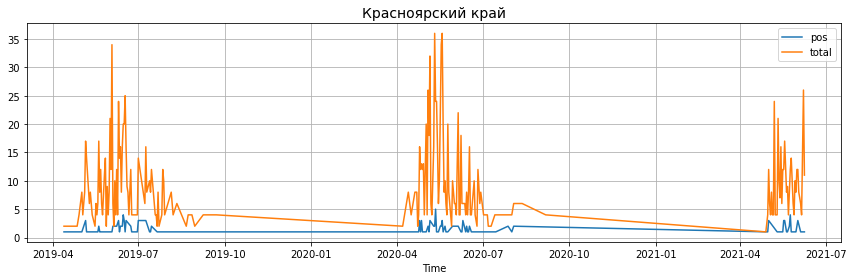

In [38]:
for region, _ in cnt_regions.most_common(10):
    region_df = df[ df['Регион'] == region ]
    
    region_pos = region_df[ region_df['pos'] == 1 ]

    region_pos_gb = region_pos.groupby('date').count().reset_index()
    region_full_gb = region_df.groupby('date').count().reset_index()
    
    plt.figure(figsize=(12, 4))
    plt.plot(region_pos_gb['date'], region_pos_gb['pos'], label='pos')
    plt.plot(region_full_gb['date'], region_full_gb['pos'], label='total')
    plt.legend()
    plt.xlabel('Time')
    plt.title(region, size=14)
    plt.grid(b=1)
    plt.tight_layout()
    plt.show()

In [122]:
# удаляем с 10 по 4 месяцы

In [41]:
# good_dates = [(df['date'][i].month >= 4) and (df['date'][i].month <= 10) for i in range(len(df['date']))]

In [120]:
# good_df = df[good_dates]
good_df = df[:]

In [121]:
good_df.head()

,Имя теста,Код теста,Значение,Регион,Дата взятия,pos,date,id
0,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-25 06:02:00,1,2019-05-25,76970
1,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:04:00,1,2019-05-27,48688
2,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:04:00,0,2019-05-27,48688
3,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:14:00,1,2019-05-27,80712
4,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:14:00,0,2019-05-27,80712


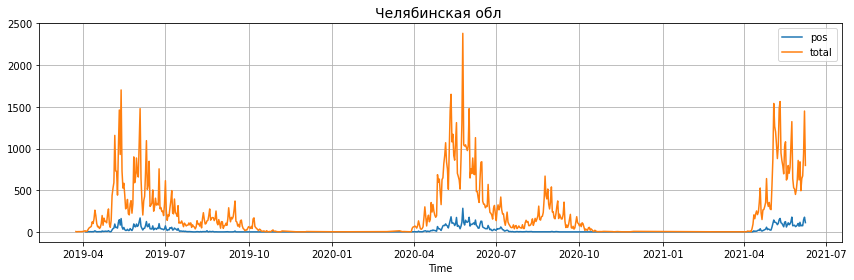

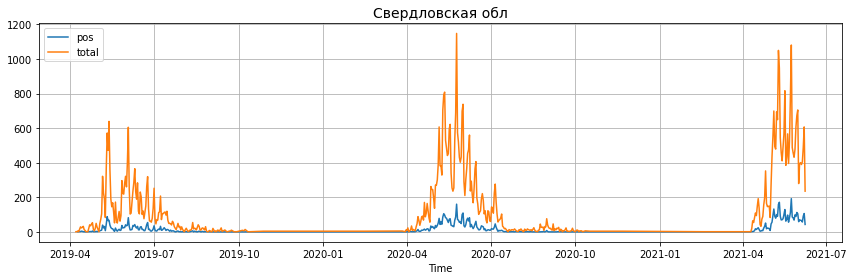

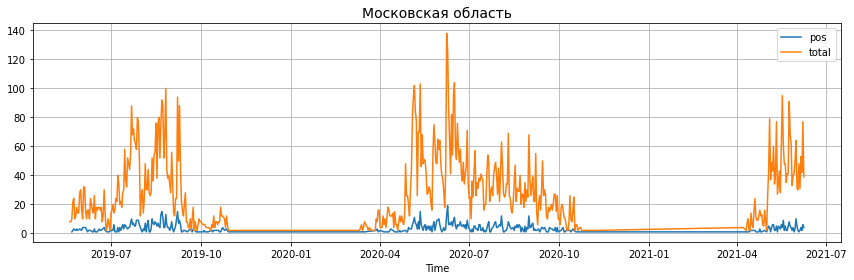

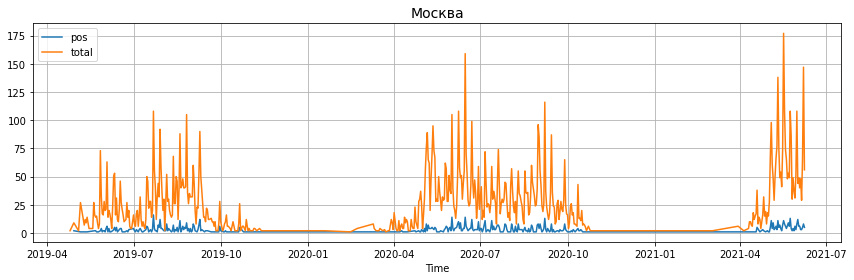

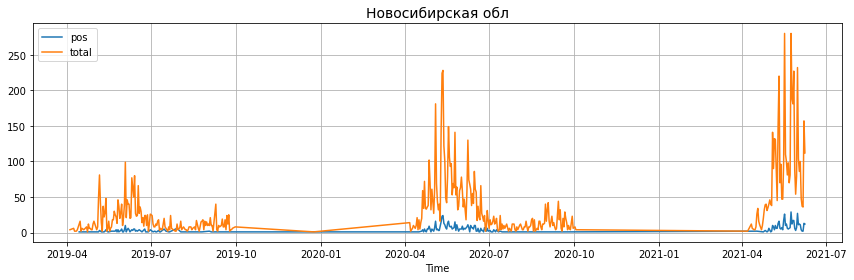

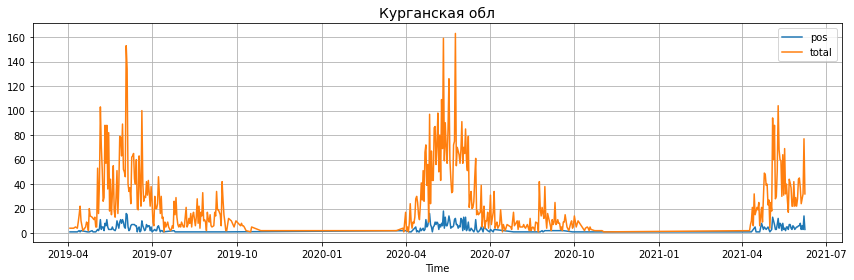

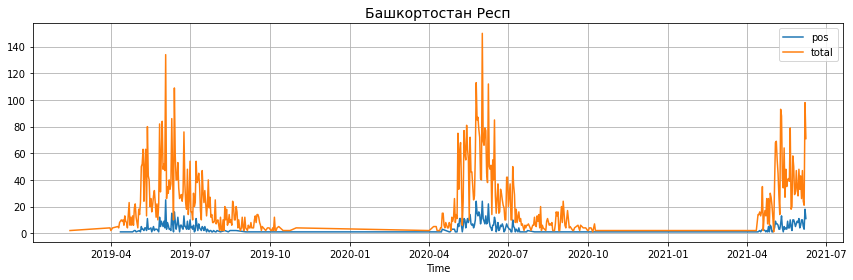

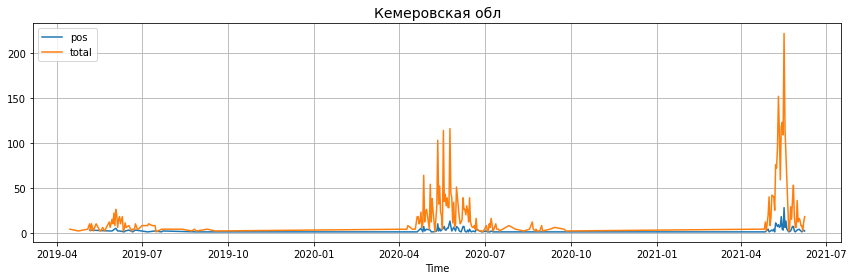

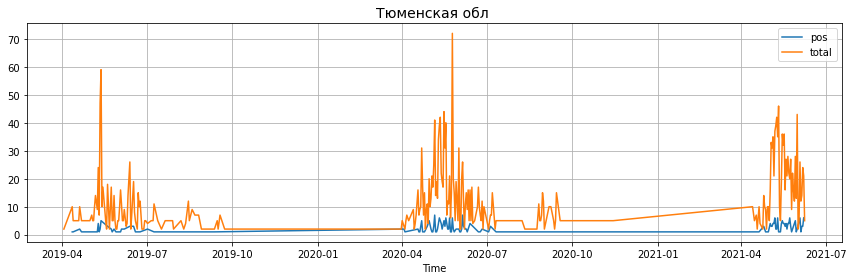

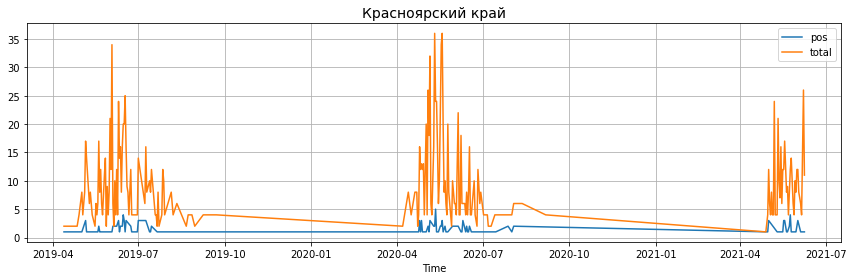

In [122]:
for region, _ in cnt_regions.most_common(10):
    region_df = good_df[ good_df['Регион'] == region ]
    
    region_pos = region_df[ region_df['pos'] == 1 ]

    region_pos_gb = region_pos.groupby('date').count().reset_index()
    region_full_gb = region_df.groupby('date').count().reset_index()
    
    plt.figure(figsize=(12, 4))
    plt.plot(region_pos_gb['date'], region_pos_gb['pos'], label='pos')
    plt.plot(region_full_gb['date'], region_full_gb['pos'], label='total')
    plt.legend()
    plt.xlabel('Time')
    plt.title(region, size=14)
    plt.grid(b=1)
    plt.tight_layout()
    plt.show()

In [123]:
good_df['total'] = 1

<ipython-input-123-54b102a76c25>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  good_df['total'] = 1


In [124]:
good_df.head()

,Имя теста,Код теста,Значение,Регион,Дата взятия,pos,date,id,total
0,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-25 06:02:00,1,2019-05-25,76970,1
1,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:04:00,1,2019-05-27,48688,1
2,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:04:00,0,2019-05-27,48688,1
3,Borrelia burgdorferi s.l (кач) ДНК,27Д,ОБНАРУЖ.,Челябинская обл,2019-05-27 09:14:00,1,2019-05-27,80712,1
4,Вирус клещевого энцефалита(кач) РНК,35Д,НЕ ОБНАР,Челябинская обл,2019-05-27 09:14:00,0,2019-05-27,80712,1


In [125]:
# region_date_gb = good_df.groupby(['Регион', 'date',]).sum().reset_index()
region_date_gb = good_df.groupby(['Регион', 'date', 'Код теста']).sum().reset_index()

In [126]:
region_date_gb

,Регион,date,Код теста,pos,id,total
0,Адыгея Респ,2019-07-30,27Д,0,35786,1
1,Адыгея Респ,2019-07-30,35Д,0,35786,1
2,Адыгея Респ,2020-04-25,27Д,0,38368,1
3,Адыгея Респ,2020-04-25,35Д,0,38368,1
4,Адыгея Респ,2020-05-19,27Д,0,108412,2
...,...,...,...,...,...,...
23194,Ярославская обл,2021-06-04,35Д,0,86900,1
23195,Ярославская обл,2021-06-07,27Д,0,83400,1
23196,Ярославская обл,2021-06-07,35Д,0,83400,1
23197,Ярославская обл,2021-06-08,27Д,1,40258,1


In [127]:
# region2max = dict(region_date_gb.groupby('Регион').max().reset_index()[['Регион', 'total',]].values)
region_test_total = region_date_gb.groupby(['Регион', 'Код теста']).max().reset_index()[['Регион', 'Код теста', 'total']].values

In [128]:
region_test2total = {(v[0], v[1]):v[2] for v in region_test_total}

In [129]:
region_test2total

{('Адыгея Респ', '27Д'): 2,
 ('Адыгея Респ', '35Д'): 1,
 ('Алтай Респ', '27Д'): 2,
 ('Алтай Респ', '34Д'): 2,
 ('Алтай Респ', '35Д'): 2,
 ('Алтай Респ', '39Д'): 2,
 ('Алтайский край', '27Д'): 5,
 ('Алтайский край', '34Д'): 2,
 ('Алтайский край', '35Д'): 5,
 ('Алтайский край', '39Д'): 2,
 ('Астраханская обл', '27Д'): 1,
 ('Астраханская обл', '35Д'): 1,
 ('Башкортостан Респ', '27Д'): 56,
 ('Башкортостан Респ', '34Д'): 16,
 ('Башкортостан Респ', '35Д'): 56,
 ('Башкортостан Респ', '36Д'): 13,
 ('Башкортостан Респ', '39Д'): 16,
 ('Белгородская обл', '27Д'): 7,
 ('Белгородская обл', '35Д'): 6,
 ('Брянская обл', '27Д'): 3,
 ('Брянская обл', '35Д'): 3,
 ('Владимирская обл', '27Д'): 4,
 ('Владимирская обл', '35Д'): 4,
 ('Волгоградская обл', '27Д'): 4,
 ('Волгоградская обл', '35Д'): 4,
 ('Воронежская обл', '27Д'): 6,
 ('Воронежская обл', '35Д'): 6,
 ('Дагестан Респ', '27Д'): 1,
 ('Дагестан Респ', '35Д'): 2,
 ('Еврейская АО', '27Д'): 2,
 ('Еврейская АО', '35Д'): 2,
 ('Забайкальский край', '27Д'):

In [130]:
region_date_gb

,Регион,date,Код теста,pos,id,total
0,Адыгея Респ,2019-07-30,27Д,0,35786,1
1,Адыгея Респ,2019-07-30,35Д,0,35786,1
2,Адыгея Респ,2020-04-25,27Д,0,38368,1
3,Адыгея Респ,2020-04-25,35Д,0,38368,1
4,Адыгея Респ,2020-05-19,27Д,0,108412,2
...,...,...,...,...,...,...
23194,Ярославская обл,2021-06-04,35Д,0,86900,1
23195,Ярославская обл,2021-06-07,27Д,0,83400,1
23196,Ярославская обл,2021-06-07,35Д,0,83400,1
23197,Ярославская обл,2021-06-08,27Д,1,40258,1


In [131]:
region2max_cnt = Counter(region_test2total)

In [132]:
region2max_cnt.most_common(10)

[(('Челябинская обл ', '35Д'), 686),
 (('Челябинская обл ', '27Д'), 682),
 (('Челябинская обл ', '34Д'), 449),
 (('Челябинская обл ', '39Д'), 449),
 (('Свердловская обл', '35Д'), 381),
 (('Свердловская обл', '27Д'), 375),
 (('Челябинская обл ', '36Д'), 148),
 (('Свердловская обл', '36Д'), 145),
 (('Свердловская обл', '34Д'), 134),
 (('Свердловская обл', '39Д'), 134)]

In [133]:
# region2max_cnt

In [134]:
len(region2max_cnt)

186

In [135]:
region_date_gb['pos_share'] = region_date_gb['pos'].values/region_date_gb['total'].values

In [136]:
# region_date_gb['total_share'] = 

In [137]:
# region_date_gb.apply(lambda x: pd.Series([1, 2], index=['foo', 'bar']), axis=1)

In [138]:
region_date_gb['total_share'] = region_date_gb.apply(lambda x: x[5]/region_test2total[(x[0], x[2])], axis=1)

In [139]:
region_date_gb

,Регион,date,Код теста,pos,id,total,pos_share,total_share
0,Адыгея Респ,2019-07-30,27Д,0,35786,1,0.0,0.5
1,Адыгея Респ,2019-07-30,35Д,0,35786,1,0.0,1.0
2,Адыгея Респ,2020-04-25,27Д,0,38368,1,0.0,0.5
3,Адыгея Респ,2020-04-25,35Д,0,38368,1,0.0,1.0
4,Адыгея Респ,2020-05-19,27Д,0,108412,2,0.0,1.0
...,...,...,...,...,...,...,...,...
23194,Ярославская обл,2021-06-04,35Д,0,86900,1,0.0,0.2
23195,Ярославская обл,2021-06-07,27Д,0,83400,1,0.0,0.2
23196,Ярославская обл,2021-06-07,35Д,0,83400,1,0.0,0.2
23197,Ярославская обл,2021-06-08,27Д,1,40258,1,1.0,0.2


In [140]:
# for region, _ in cnt_regions.most_common(10):
#     region_df = region_date_gb[ region_date_gb['Регион'] == region ]
    
#     plt.figure(figsize=(12, 4))
#     plt.plot(region_df['date'], region_df['pos_share'], label='pos')
#     plt.plot(region_df['date'], region_df['total_share'], label='total')
#     plt.legend()
#     plt.xlabel('Time')
#     plt.title(region, size=14)
#     plt.grid(b=1)
#     plt.tight_layout()
#     plt.show()

In [141]:
# for region, _ in cnt_regions.most_common(10):
#     region_df = region_date_gb[ region_date_gb['Регион'] == region ]
    
#     plt.figure(figsize=(12, 4))
#     plt.plot(region_df['date'], region_df['pos_share'], label='pos')
#     plt.plot(region_df['date'], region_df['total_share'], label='total')
#     plt.legend()
#     plt.xlabel('Time')
#     plt.title(region, size=14)
#     plt.grid(b=1)
#     plt.tight_layout()
#     plt.show()

In [142]:
region_date_gb

,Регион,date,Код теста,pos,id,total,pos_share,total_share
0,Адыгея Респ,2019-07-30,27Д,0,35786,1,0.0,0.5
1,Адыгея Респ,2019-07-30,35Д,0,35786,1,0.0,1.0
2,Адыгея Респ,2020-04-25,27Д,0,38368,1,0.0,0.5
3,Адыгея Респ,2020-04-25,35Д,0,38368,1,0.0,1.0
4,Адыгея Респ,2020-05-19,27Д,0,108412,2,0.0,1.0
...,...,...,...,...,...,...,...,...
23194,Ярославская обл,2021-06-04,35Д,0,86900,1,0.0,0.2
23195,Ярославская обл,2021-06-07,27Д,0,83400,1,0.0,0.2
23196,Ярославская обл,2021-06-07,35Д,0,83400,1,0.0,0.2
23197,Ярославская обл,2021-06-08,27Д,1,40258,1,1.0,0.2


In [143]:
len(cnt_regions)

67

In [144]:
codes = list(set(good_df['Код теста'].values))

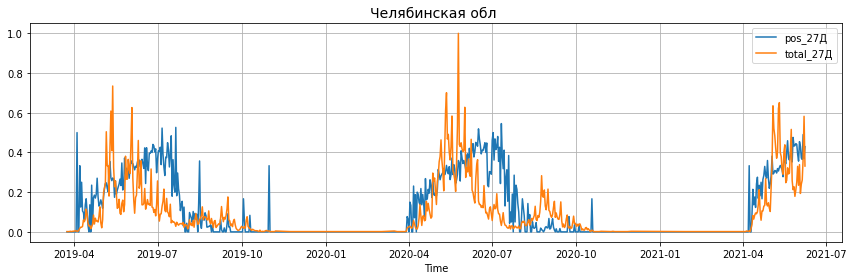

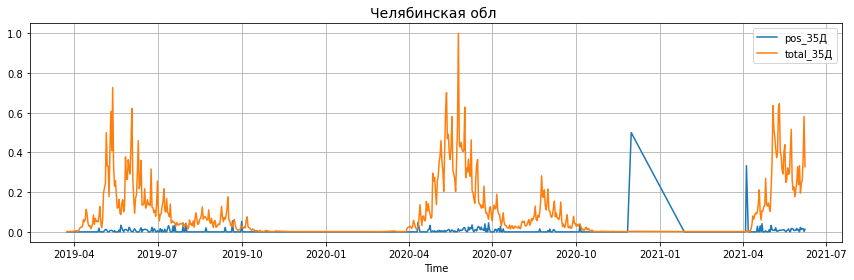

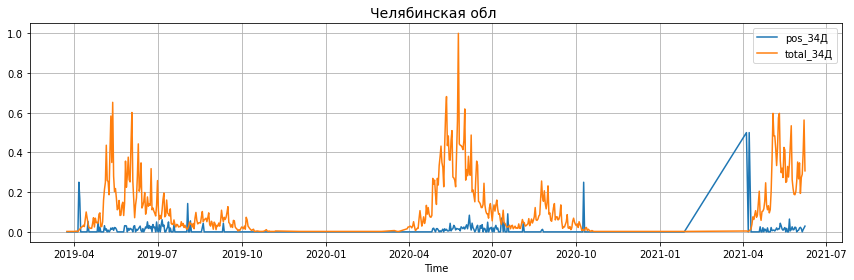

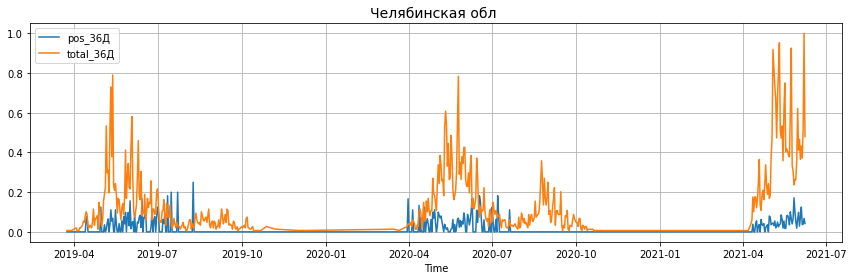

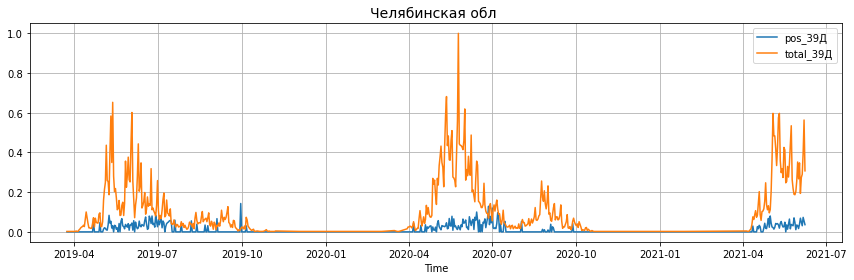

...

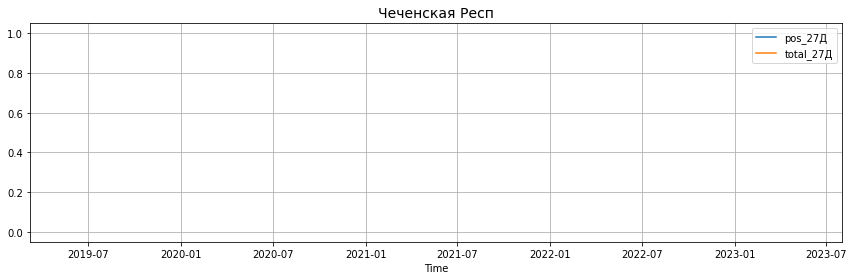

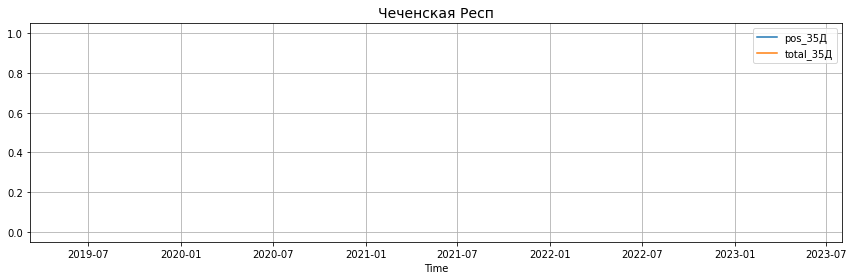

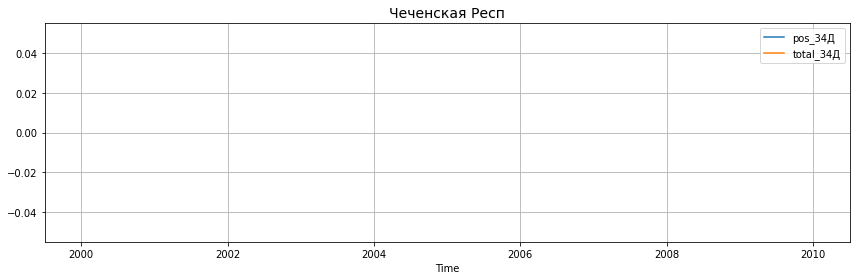

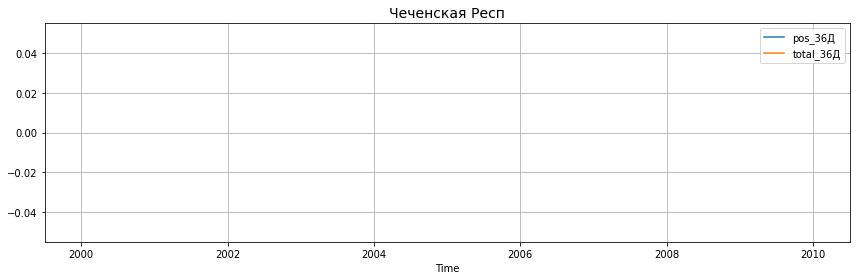

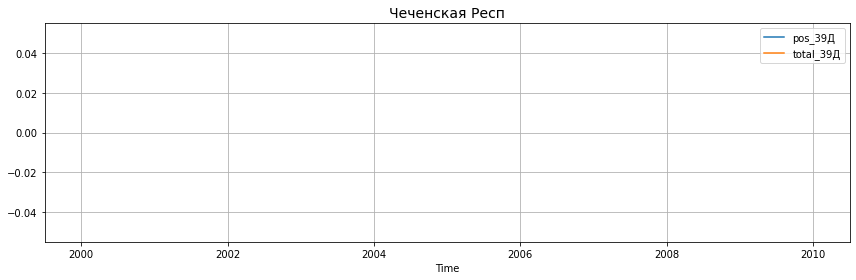

In [145]:
for region, _ in cnt_regions.most_common(67):
    region_df = region_date_gb[ region_date_gb['Регион'] == region ]
    
    for code in codes:
        plt.figure(figsize=(12, 4))
        region_df_code = region_df[ region_df['Код теста'] == code ]
        plt.plot(region_df_code['date'], region_df_code['pos_share'], label=f'pos_{code}')
        plt.plot(region_df_code['date'], region_df_code['total_share'], label=f'total_{code}')
        plt.legend()
        plt.xlabel('Time')
        plt.title(region, size=14)
        plt.grid(b=1)
        plt.tight_layout()
        plt.show()

In [74]:
region_df = region_date_gb[ region_date_gb['Регион'] == 'Челябинская обл ' ]

In [75]:
region_df

,Регион,date,Код теста,pos,id,total,pos_share,total_share
20118,Челябинская обл,2019-04-02,27Д,0,64772,3,0.000000,0.004399
20119,Челябинская обл,2019-04-02,34Д,0,24687,1,0.000000,0.002227
20120,Челябинская обл,2019-04-02,35Д,0,64772,3,0.000000,0.004373
20121,Челябинская обл,2019-04-02,39Д,0,24687,1,0.000000,0.002227
20122,Челябинская обл,2019-04-03,27Д,0,107860,4,0.000000,0.005865
...,...,...,...,...,...,...,...,...
22495,Челябинская обл,2021-06-08,27Д,97,9435099,226,0.429204,0.331378
22496,Челябинская обл,2021-06-08,34Д,4,5877733,138,0.028986,0.307350
22497,Челябинская обл,2021-06-08,35Д,3,9377924,225,0.013333,0.327988
22498,Челябинская обл,2021-06-08,36Д,3,3110688,71,0.042254,0.479730


## Предсказание вероятностей для каждой области

In [475]:
region_test_df = region_date_gb.groupby(['Регион', 'Код теста']).sum().reset_index()[['Регион', 'Код теста', 'pos', 'total']]

In [476]:
region_test_df['pos_share'] = region_test_df.apply(lambda x : x[2]/x[3], axis=1)

In [477]:
region_test_df[region_test_df['Код теста']=='27Д']

,Регион,Код теста,pos,total,pos_share
0,Адыгея Респ,27Д,3,11,0.272727
2,Алтай Респ,27Д,5,22,0.227273
6,Алтайский край,27Д,16,120,0.133333
10,Астраханская обл,27Д,0,5,0.000000
12,Башкортостан Респ,27Д,1145,3732,0.306806
...,...,...,...,...,...
173,Челябинская обл,27Д,12763,45467,0.280709
178,Чеченская Респ,27Д,0,1,0.000000
180,Чувашская Респ,27Д,5,33,0.151515
182,Ямало-Ненецкий АО,27Д,0,1,0.000000


In [478]:
# region_test_df.to_csv("RegionTestPositiveShareData.csv")

In [479]:
region_date_gb_chel_27 = region_date_gb[(region_date_gb['Код теста'] == '27Д') & (region_date_gb['Регион'] == 'Челябинская обл ')]

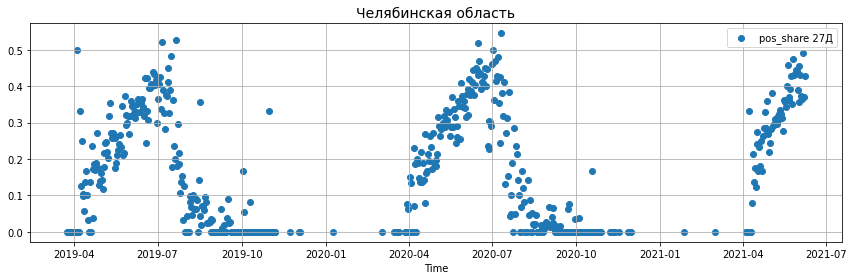

In [480]:
plt.figure(figsize=(12, 4))
plt.scatter(region_date_gb_chel_27['date'], region_date_gb_chel_27['pos_share'], label='pos_share 27Д')
plt.legend()
plt.xlabel('Time')
plt.title('Челябинская область', size=14)
plt.grid(b=1)
plt.tight_layout()
plt.show()

In [481]:
region_date_gb_chel_27.head()

,Регион,date,Код теста,pos,id,total,pos_share,total_share
20413,Челябинская обл,2019-03-24,27Д,0,44419,1,0.0,0.001466
20418,Челябинская обл,2019-03-25,27Д,0,11834,1,0.0,0.001466
20420,Челябинская обл,2019-03-26,27Д,0,73814,1,0.0,0.001466
20424,Челябинская обл,2019-03-28,27Д,0,108111,2,0.0,0.002933
20426,Челябинская обл,2019-03-29,27Д,0,24733,1,0.0,0.001466


In [482]:
split_date = pd.Timestamp(max(region_date_gb_chel_27.date.values))-pd.Timedelta(days=14)

In [483]:
X_train_27_chel = region_date_gb_chel_27[:]
# X_test_27_chel = region_date_gb_chel_27[region_date_gb_chel_27['date'] >= split_date]

In [484]:
X_train_27_chel.shape, X_test_27_chel.shape

((515, 8), (15, 8))

In [488]:
X_train_27_chel_p = X_train_27_chel[['date', 'pos_share']]
X_train_27_chel_p.columns = ['ds', 'y']

In [489]:
X_test_27_chel_p = X_test[X_test['region']=='Челябинская обл '][['date']]
X_test_27_chel_p.columns = ['ds']

In [490]:
X_train_27_chel_p.shape

(515, 2)

In [491]:
X_test_27_chel_p.shape

(19, 1)

In [492]:
# X_train_27_chel.to_csv("X_train_27.csv")
# X_test_27_chel.to_csv("X_test_27.csv")

In [493]:
model = Prophet(interval_width=0.9)
model.fit(X_train_27_chel_p)
forecast = model.predict(X_test_27_chel_p)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


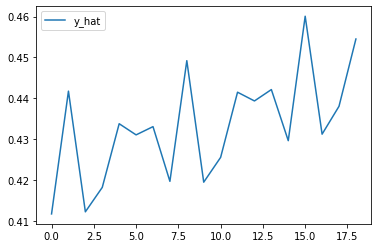

In [494]:
plt.plot(forecast['yhat'].values, label='y_hat')
# plt.plot(X_test_27_chel['pos_share'].values, label='gt')
plt.legend()

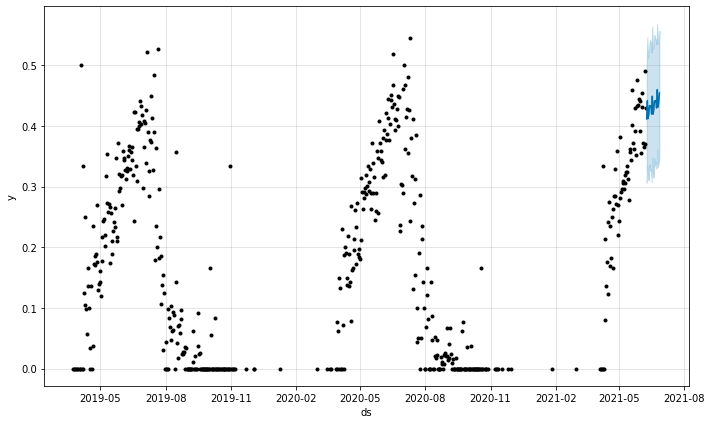

In [495]:
fig1 = model.plot(forecast)
# plt.scatter(X_test_27_chel['date'].values, X_test_27_chel['pos_share'].values, c='red', s=1.)

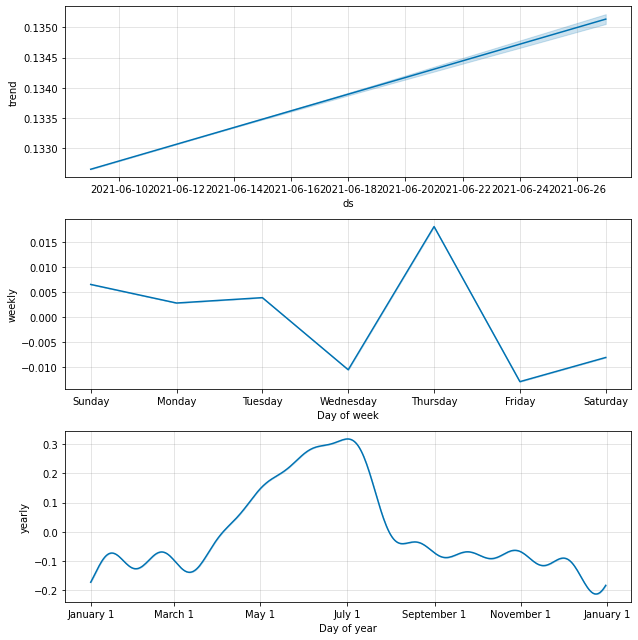

In [496]:
fig2 = model.plot_components(forecast)

In [214]:
def MAE(y, y_hat):
    return np.abs(y-y_hat).sum()

In [225]:
MAE(forecast['yhat'].values, X_test_27_chel['pos_share'].values)

0.7326490942868937

In [503]:
region_test_df

,Регион,Код теста,pos,total,pos_share
0,Адыгея Респ,27Д,3,11,0.272727
1,Адыгея Респ,35Д,0,11,0.000000
2,Алтай Респ,27Д,5,22,0.227273
3,Алтай Респ,34Д,0,14,0.000000
4,Алтай Респ,35Д,0,24,0.000000
...,...,...,...,...,...
181,Чувашская Респ,35Д,0,35,0.000000
182,Ямало-Ненецкий АО,27Д,0,1,0.000000
183,Ямало-Ненецкий АО,35Д,0,1,0.000000
184,Ярославская обл,27Д,36,162,0.222222


In [504]:
region_test2prob = {}

for idx, row in region_test_df.iterrows():
    region_test2prob[(row['Регион'], row['Код теста'])] = row['pos_share']

In [499]:
chel_27_pred = forecast[['ds', 'yhat']]

In [528]:
full_prob_data = []

In [535]:
for date in chel_27_pred.ds:
    for region in all_regions:
        new_row = []
            
        new_row.append(region)
        new_row.append(date)
        
        if (region != 'Челябинская обл '):
            try:
                new_row.append(region_test2prob[(region, '27Д')])
            except:
                new_row.append(0.)
        else:
            new_row.append(chel_27_pred[chel_27_pred['ds'] == date]['yhat'].values[0])
            
        try:
            new_row.append(region_test2prob[(region, '34Д')])
        except:
            new_row.append(0.)
            
        try:
            new_row.append(region_test2prob[(region, '35Д')])
        except:
            new_row.append(0.)
            
        try:
            new_row.append(region_test2prob[(region, '36Д')])
        except:
            new_row.append(0.)
            
        try:
            new_row.append(region_test2prob[(region, '39Д')])
        except:
            new_row.append(0.)
        
        full_prob_data.append(new_row)

In [540]:
full_prob_df = pd.DataFrame(full_prob_data, columns=all_tests_df.columns)

In [544]:
full_prob_df.to_csv("PredictedProbsData.csv")

In [545]:
full_prob_df

,region,date,27,34,35,36,39
0,Башкортостан Респ,2021-06-09,0.306806,0.012850,0.007421,0.046189,0.035047
1,Челябинская обл,2021-06-09,0.411716,0.013015,0.006968,0.039576,0.029205
2,Курганская обл,2021-06-09,0.275202,0.018868,0.011694,0.073801,0.037838
3,Тюменская обл,2021-06-09,0.321608,0.020284,0.007481,0.070994,0.016194
4,Новосибирская обл,2021-06-09,0.237576,0.021333,0.009571,0.000000,0.019040
...,...,...,...,...,...,...,...
1268,Забайкальский край,2021-06-27,0.555556,0.000000,0.000000,0.000000,0.000000
1269,Коми Респ,2021-06-27,0.000000,0.000000,0.000000,0.000000,0.000000
1270,Еврейская АО,2021-06-27,0.333333,0.000000,0.000000,0.000000,0.000000
1271,Санкт-Петербург,2021-06-27,0.575000,0.012346,0.000000,0.012346,0.049383


In [546]:
full_prob_df

,region,date,27,34,35,36,39
0,Башкортостан Респ,2021-06-09,0.306806,0.012850,0.007421,0.046189,0.035047
1,Челябинская обл,2021-06-09,0.411716,0.013015,0.006968,0.039576,0.029205
2,Курганская обл,2021-06-09,0.275202,0.018868,0.011694,0.073801,0.037838
3,Тюменская обл,2021-06-09,0.321608,0.020284,0.007481,0.070994,0.016194
4,Новосибирская обл,2021-06-09,0.237576,0.021333,0.009571,0.000000,0.019040
...,...,...,...,...,...,...,...
1268,Забайкальский край,2021-06-27,0.555556,0.000000,0.000000,0.000000,0.000000
1269,Коми Респ,2021-06-27,0.000000,0.000000,0.000000,0.000000,0.000000
1270,Еврейская АО,2021-06-27,0.333333,0.000000,0.000000,0.000000,0.000000
1271,Санкт-Петербург,2021-06-27,0.575000,0.012346,0.000000,0.012346,0.049383


In [552]:
region_date_pos_gb = region_date_gb.groupby(['Регион', 'date', 'Код теста']).sum().reset_index()[['Регион', 'Код теста', 'date', 'pos', 'total']]

In [554]:
region_date_pos_gb['prob'] = region_date_pos_gb['pos'].values/region_date_pos_gb['total'].values

In [556]:
code2idx = {'27Д':0, '34Д':1, '35Д':2, '36Д':3, '39Д':4}

In [557]:
all_probs_data = []
all_probs_dict = {}

for idx, row in region_date_pos_gb.iterrows():
    key = (row['Регион'], row['date'])
    region = row['Регион']
    
    if key in all_probs_dict:
        all_probs_dict[key][code2idx[row['Код теста']]] = row['prob']
    else:
        all_probs_dict[key] = [0., 0., 0., 0., 0.]
        all_probs_dict[key][code2idx[row['Код теста']]] = row['prob']

In [559]:
for key, value in all_probs_dict.items():
    all_probs_data.append([key[0], key[1], *value])

In [561]:
all_probs_df = pd.DataFrame(all_probs_data, columns=full_prob_df.columns)

In [563]:
all_probs_df = all_probs_df.append(full_prob_df)

In [567]:
all_probs_df.to_csv("AllProbsData.csv")

In [517]:
all_regions['Челябинская обл ']

515

In [520]:
region_test2prob

{('Адыгея Респ', '27Д'): 0.2727272727272727,
 ('Адыгея Респ', '35Д'): 0.0,
 ('Алтай Респ', '27Д'): 0.22727272727272727,
 ('Алтай Респ', '34Д'): 0.0,
 ('Алтай Респ', '35Д'): 0.0,
 ('Алтай Респ', '39Д'): 0.07142857142857142,
 ('Алтайский край', '27Д'): 0.13333333333333333,
 ('Алтайский край', '34Д'): 0.0,
 ('Алтайский край', '35Д'): 0.016666666666666666,
 ('Алтайский край', '39Д'): 0.02,
 ('Астраханская обл', '27Д'): 0.0,
 ('Астраханская обл', '35Д'): 0.0,
 ('Башкортостан Респ', '27Д'): 0.30680600214362275,
 ('Башкортостан Респ', '34Д'): 0.012850467289719626,
 ('Башкортостан Респ', '35Д'): 0.0074211502782931356,
 ('Башкортостан Респ', '36Д'): 0.046189376443418015,
 ('Башкортостан Респ', '39Д'): 0.035046728971962614,
 ('Белгородская обл', '27Д'): 0.22666666666666666,
 ('Белгородская обл', '35Д'): 0.0,
 ('Брянская обл', '27Д'): 0.16666666666666666,
 ('Брянская обл', '35Д'): 0.0,
 ('Владимирская обл', '27Д'): 0.19327731092436976,
 ('Владимирская обл', '35Д'): 0.0,
 ('Волгоградская обл', '27

In [501]:
for idx, row in 

,region,date,27,34,35,36,39
0,Адыгея Респ,2019-07-30,1.0,0.0,1.0,0.0,0.0
1,Адыгея Респ,2020-04-25,1.0,0.0,1.0,0.0,0.0
2,Адыгея Респ,2020-05-19,2.0,0.0,0.0,0.0,0.0
3,Адыгея Респ,2020-07-31,1.0,0.0,1.0,0.0,0.0
4,Адыгея Респ,2021-05-11,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...
1268,Ямало-Ненецкий АО,2021-06-23,0.0,0.0,0.0,0.0,0.0
1269,Ямало-Ненецкий АО,2021-06-24,0.0,0.0,0.0,0.0,0.0
1270,Ямало-Ненецкий АО,2021-06-25,0.0,0.0,0.0,0.0,0.0
1271,Ямало-Ненецкий АО,2021-06-26,0.0,0.0,0.0,0.0,0.0


In [519]:
all_tests_df

,region,date,27,34,35,36,39
0,Адыгея Респ,2019-07-30,1.0,0.0,1.0,0.0,0.0
1,Адыгея Респ,2020-04-25,1.0,0.0,1.0,0.0,0.0
2,Адыгея Респ,2020-05-19,2.0,0.0,0.0,0.0,0.0
3,Адыгея Респ,2020-07-31,1.0,0.0,1.0,0.0,0.0
4,Адыгея Респ,2021-05-11,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...
1268,Ямало-Ненецкий АО,2021-06-23,0.0,0.0,0.0,0.0,0.0
1269,Ямало-Ненецкий АО,2021-06-24,0.0,0.0,0.0,0.0,0.0
1270,Ямало-Ненецкий АО,2021-06-25,0.0,0.0,0.0,0.0,0.0
1271,Ямало-Ненецкий АО,2021-06-26,0.0,0.0,0.0,0.0,0.0


## Читаем группы 

In [76]:
types_and_counts_df = pd.read_csv("customer_types.csv", index_col=0)

In [77]:
types_and_counts_df['date'] = pd.to_datetime(types_and_counts_df['date'])

In [78]:
types_and_counts_df.dtypes

date          datetime64[ns]
Регион                object
cnt_type_1           float64
cnt_type_2           float64
cnt_type_3           float64
cnt_other            float64
dtype: object

In [79]:
types_and_counts_df.head()

,date,Регион,cnt_type_1,cnt_type_2,cnt_type_3,cnt_other
0,2019-02-13,Башкортостан Респ,0.0,1.0,0.0,0.0
1,2019-03-24,Челябинская обл,1.0,0.0,0.0,0.0
2,2019-03-25,Челябинская обл,0.0,1.0,0.0,0.0
3,2019-03-26,Челябинская обл,0.0,0.0,1.0,0.0
4,2019-03-28,Челябинская обл,0.0,2.0,0.0,0.0


In [80]:
types_and_counts_df['cnt_type_sum'] = types_and_counts_df.apply(lambda x : sum([x[2], x[3], x[4], x[5]]), axis=1)

In [81]:
types_and_counts_df['cnt_type_1_share'] = types_and_counts_df.apply(lambda x : x[2]/x[6], axis=1)
types_and_counts_df['cnt_type_2_share'] = types_and_counts_df.apply(lambda x : x[3]/x[6], axis=1)
types_and_counts_df['cnt_type_3_share'] = types_and_counts_df.apply(lambda x : x[4]/x[6], axis=1)
types_and_counts_df['cnt_type_4_share'] = types_and_counts_df.apply(lambda x : x[5]/x[6], axis=1)

In [82]:
types_and_counts_df

,date,Регион,cnt_type_1,cnt_type_2,cnt_type_3,cnt_other,cnt_type_sum,cnt_type_1_share,cnt_type_2_share,cnt_type_3_share,cnt_type_4_share
0,2019-02-13,Башкортостан Респ,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000
1,2019-03-24,Челябинская обл,1.0,0.0,0.0,0.0,1.0,1.000000,0.000000,0.000000,0.000000
2,2019-03-25,Челябинская обл,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000
3,2019-03-26,Челябинская обл,0.0,0.0,1.0,0.0,1.0,0.000000,0.000000,1.000000,0.000000
4,2019-03-28,Челябинская обл,0.0,2.0,0.0,0.0,2.0,0.000000,1.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
7652,2021-06-08,Тульская обл,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000
7653,2021-06-08,Тюменская обл,1.0,0.0,0.0,0.0,1.0,1.000000,0.000000,0.000000,0.000000
7654,2021-06-08,Хакасия Респ,0.0,0.0,2.0,0.0,2.0,0.000000,0.000000,1.000000,0.000000
7655,2021-06-08,Челябинская обл,73.0,88.0,63.0,3.0,227.0,0.321586,0.387665,0.277533,0.013216


In [83]:
regions_cnt = Counter(types_and_counts_df['Регион'].values)

In [84]:
regions_cnt.most_common(5)

[('Челябинская обл ', 515),
 ('Москва', 465),
 ('Московская область', 460),
 ('Свердловская обл', 430),
 ('Курганская обл', 409)]

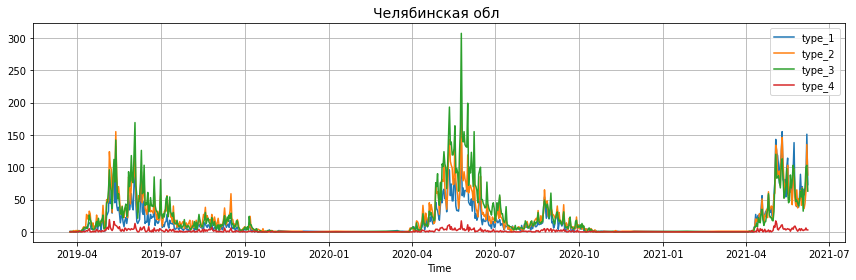

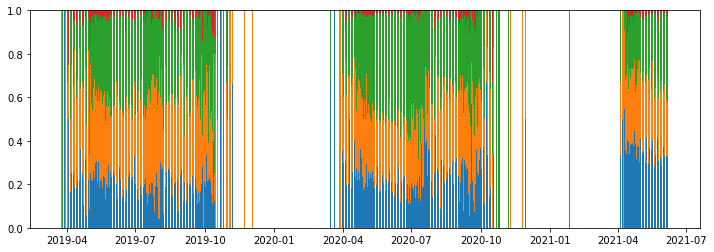

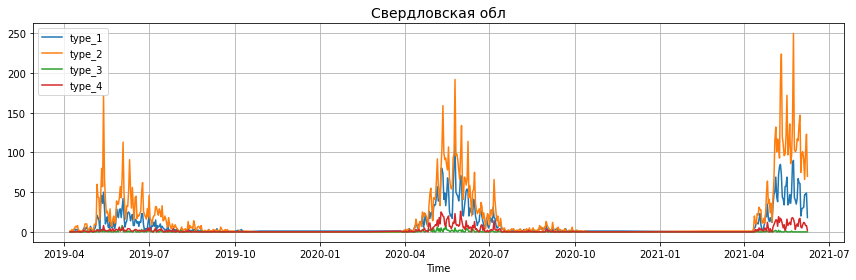

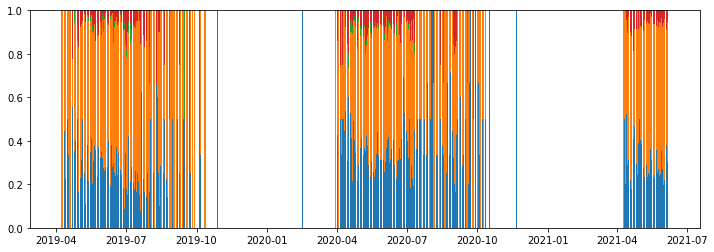

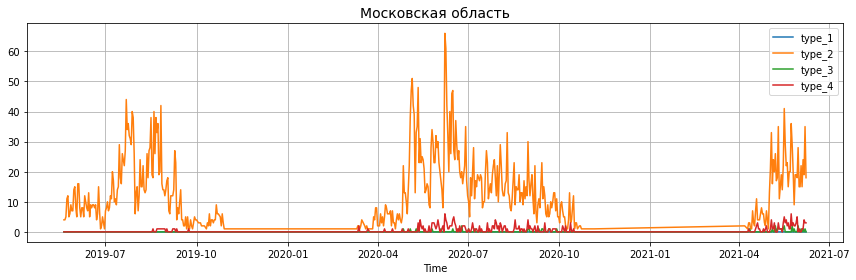

...

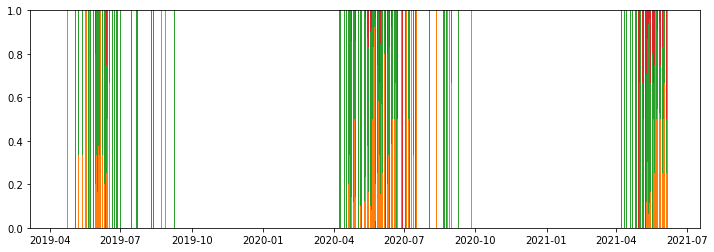

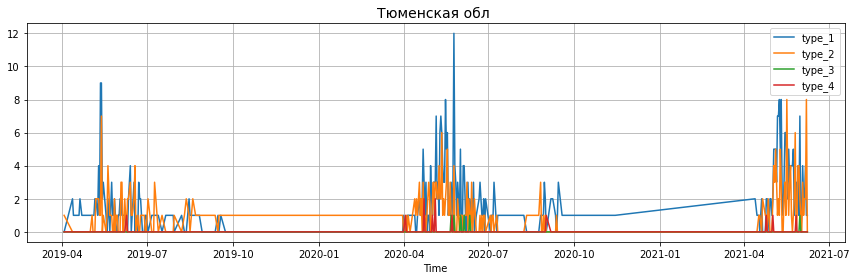

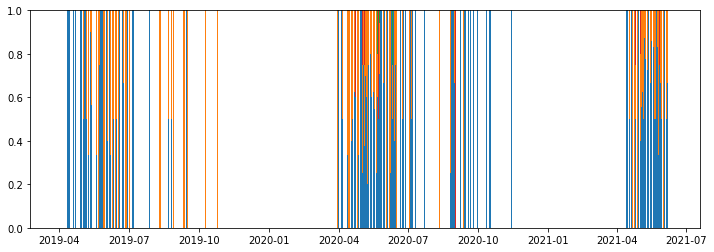

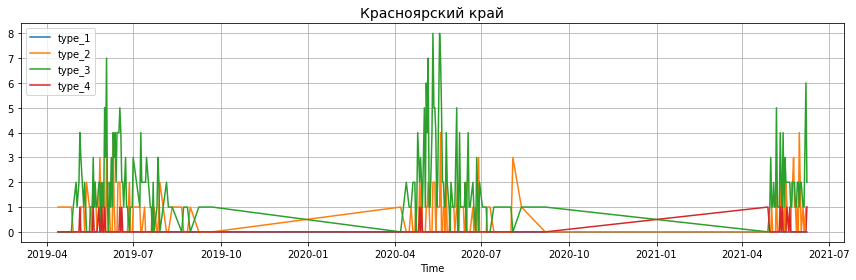

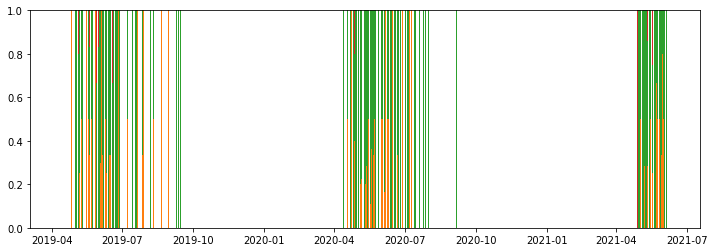

In [85]:
for region, _ in cnt_regions.most_common(10):
    region_df = types_and_counts_df[ types_and_counts_df['Регион'] == region ]
    
    plt.figure(figsize=(12, 4))
    
    for p_type in range(4):
        plt.plot(region_df['date'], region_df.iloc[:, 2+p_type], label=f'type_{p_type+1}')
        plt.legend()
        plt.xlabel('Time')
        plt.title(region, size=14)
        plt.grid(b=1)
        plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(12, 4))
    val_1 = region_df['cnt_type_1_share'].values
    val_2 = region_df['cnt_type_2_share'].values
    val_3 = region_df['cnt_type_3_share'].values
    val_4 = region_df['cnt_type_4_share'].values

    plt.bar(region_df['date'], val_1)
    plt.bar(region_df['date'], val_2, bottom = val_1)
    plt.bar(region_df['date'], val_3, bottom = val_1+val_2)
    plt.bar(region_df['date'], val_4, bottom = val_1+val_2+val_3)
    plt.show()

## Делим данные

In [86]:
day_before = datetime.now() - relativedelta(days=32)

In [87]:
# X_train = types_and_counts_df[types_and_counts_df['date'] < day_before]
# X_test = types_and_counts_df[types_and_counts_df['date'] >= day_before]

In [88]:
region2lastdate = dict(types_and_counts_df.groupby("Регион").max().reset_index()[['Регион', 'date']].values)

In [89]:
types_and_counts_df['delta_date'] = types_and_counts_df.apply(lambda x : x[0]-region2lastdate[x[1]], axis=1)

In [90]:
X_train = types_and_counts_df[types_and_counts_df['delta_date'] < -pd.Timedelta(days=14)]
X_test = types_and_counts_df[types_and_counts_df['delta_date'] >= -pd.Timedelta(days=14)]

In [91]:
X_train.shape

(7163, 12)

In [92]:
X_test.shape

(494, 12)

In [93]:
set(X_test['Регион'].values) - set(X_train['Регион'].values)

{'Кабардино-Балкарская Респ', 'Чеченская Респ', 'Ямало-Ненецкий АО'}

In [94]:
X_test = X_test[~X_test['Регион'].isin(['Кабардино-Балкарская Респ', 'Чеченская Респ', 'Ямало-Ненецкий АО'])]

In [95]:
# Counter(df['Регион'].values).most_common(67)

In [96]:
X_train.shape

(7163, 12)

In [97]:
X_test.shape

(491, 12)

In [239]:
Counter(types_and_counts_df['Регион'].values).most_common(67)

[('Челябинская обл ', 515),
 ('Москва', 465),
 ('Московская область', 460),
 ('Свердловская обл', 430),
 ('Курганская обл', 409),
 ('Башкортостан Респ', 407),
 ('Новосибирская обл', 387),
 ('Калужская обл', 278),
 ('Краснодарский край', 261),
 ('Тюменская обл ', 259),
 ('Калининградская обл', 214),
 ('Кемеровская обл', 203),
 ('Красноярский край', 200),
 ('Владимирская обл', 165),
 ('Татарстан Респ', 140),
 ('Тульская обл', 139),
 ('Ивановская обл', 135),
 ('Иркутская обл', 132),
 ('Белгородская обл', 126),
 ('Нижегородская обл', 122),
 ('Хакасия Респ', 120),
 ('Тверская обл', 120),
 ('Самарская обл', 120),
 ('Рязанская обл', 119),
 ('Воронежская обл', 117),
 ('Ярославская обл', 116),
 ('Ханты-Мансийский АО', 110),
 ('Саратовская обл', 106),
 ('Приморский край', 92),
 ('Орловская обл', 90),
 ('Алтайский край', 88),
 ('Хабаровский край', 86),
 ('Ростовская обл', 81),
 ('Крым Респ', 77),
 ('Смоленская обл', 72),
 ('Томская обл', 60),
 ('Северная Осетия Респ', 50),
 ('Омская обл', 44),
 (

In [246]:
# types_and_counts_df[types_and_counts_df['Регион']=='Кировская обл']

In [245]:
# types_and_counts_df[types_and_counts_df['Регион']=='Сахалинская обл']

In [247]:
X_train = types_and_counts_df[~types_and_counts_df['Регион'].isin(['Еврейская АО', 'Кабардино-Балкарская Респ', 'Чеченская Респ', 'Ямало-Ненецкий АО'])]

In [251]:
X_train = X_train[['date', 'Регион', 'cnt_type_1', 'cnt_type_2', 'cnt_type_3', 'cnt_other']]

In [252]:
X_train

,date,Регион,cnt_type_1,cnt_type_2,cnt_type_3,cnt_other
0,2019-02-13,Башкортостан Респ,0.0,1.0,0.0,0.0
1,2019-03-24,Челябинская обл,1.0,0.0,0.0,0.0
2,2019-03-25,Челябинская обл,0.0,1.0,0.0,0.0
3,2019-03-26,Челябинская обл,0.0,0.0,1.0,0.0
4,2019-03-28,Челябинская обл,0.0,2.0,0.0,0.0
...,...,...,...,...,...,...
7652,2021-06-08,Тульская обл,0.0,1.0,0.0,0.0
7653,2021-06-08,Тюменская обл,1.0,0.0,0.0,0.0
7654,2021-06-08,Хакасия Респ,0.0,0.0,2.0,0.0
7655,2021-06-08,Челябинская обл,73.0,88.0,63.0,3.0


In [257]:
X_test = pd.DataFrame(columns=['ds', 'region'])

In [259]:
all_regions = Counter(types_and_counts_df['Регион'].values)

In [260]:
len(all_regions)

67

In [265]:
X_test['ds'] = list(pd.date_range('2021.06.09', '2021.06.27', freq='1d'))*67

In [276]:
len(pd.date_range('2021.06.09', '2021.06.27', freq='1d'))

19

In [278]:
regions_list = [[region]*19 for region in all_regions]

In [281]:
X_test['region'] = [item for sublist in regions_list for item in sublist]

In [298]:
X_test.columns = ['date', 'region']

In [287]:
# Counter(df['Регион'].values).most_common(67)

## Модельки

In [288]:
# !pip install prophet

In [289]:
from prophet import Prophet

In [290]:
def MAE(y_true, y_pred):
    np.abs(y_true-y_pred).mean()

In [291]:
regions = list(set(X_train['Регион'].values))

In [292]:
print(len(regions), regions[:5])

63 ['Курская обл', 'Москва', 'Алтай Респ', 'Калининградская обл', 'Хакасия Респ']


In [293]:
type2name = {0:'cnt_type_1', 1:'cnt_type_2', 2:'cnt_type_3', 3:'cnt_other'}

In [294]:
# region_type2prophet = {}

In [299]:
total_df = pd.DataFrame(columns=['date', 'region',
                                 'prophet_cnt_type_1',
                                 'prophet_cnt_type_2',
                                 'prophet_cnt_type_3',
                                 'prophet_cnt_other',])

for region in tqdm(regions):
    X_train_reg = X_train[X_train['Регион']==region][['date', 'Регион', 'cnt_type_1', 'cnt_type_2', 'cnt_type_3', 'cnt_other']]
    X_test_reg = X_test[X_test['region']==region][['date', 'region']]

    predictions_reg = pd.DataFrame(columns=['date'])
    predictions_reg['date'] = X_test_reg['date'].values
    predictions_reg['region'] = region

    for cnt_type in range(4):
        X_train_proph = X_train_reg[['date', type2name[cnt_type]]]
        X_train_proph.columns = ['ds', 'y']

        X_test_proph = X_test_reg[['date']]
        X_test_proph.columns = ['ds']

        model = Prophet(interval_width=0.9)
        model.fit(X_train_proph)
        forecast = model.predict(X_test_proph)

        predictions_reg[f'prophet_{type2name[cnt_type]}'] = forecast['yhat'].values

        # region_type2prophet[(region, cnt_type)] = model

    total_df = total_df.append(predictions_reg)

  0%|          | 0/63 [00:00<?, ?it/s]INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  2%|▏         | 1/63 [00:04<04:53,  4.73s/it]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:pro

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
 16%|█▌        | 10/63 [00:45<03:52,  4.39s/it]INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run 

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
 38%|███▊      | 24/63 [01:51<03:22,  5.19s/it]INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 6.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 6.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
 57%|█████▋    | 36/63 [03:13<02:19,  5.16s/it]INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 5.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_season

INFO:prophet:n_changepoints greater than number of observations. Using 13.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 13.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 13.
 73%|███████▎  | 46/63 [04:04<01:19,  4.70s/it]INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabli

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
 90%|█████████ | 57/63 [04:54<00:26,  4.50s/it]INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run 

In [307]:
set(X_test['region']) - set(total_df['region'])

{'Еврейская АО',
 'Кабардино-Балкарская Респ',
 'Чеченская Респ',
 'Ямало-Ненецкий АО'}

In [309]:
total_df.columns

Index(['date', 'region', 'prophet_cnt_type_1', 'prophet_cnt_type_2',
       'prophet_cnt_type_3', 'prophet_cnt_other'],
      dtype='object')

In [318]:
full_total_df = total_df.copy()

In [319]:
for region in ['Еврейская АО', 'Кабардино-Балкарская Респ', 'Чеченская Респ', 'Ямало-Ненецкий АО']:
    region_pred_data = []
    for date in pd.date_range('2021.06.09', '2021.06.27', freq='1d'):
        region_pred_data.append([date, region, 0., 0., 0., 0.])
    
    region_pred_df = pd.DataFrame(region_pred_data, columns=total_df.columns)
    full_total_df = full_total_df.append(region_pred_df)

In [327]:
pred_data = full_total_df[['prophet_cnt_type_1', 'prophet_cnt_type_2', 'prophet_cnt_type_3', 'prophet_cnt_other']].values

In [335]:
full_total_df[['prophet_cnt_type_1', 'prophet_cnt_type_2', 'prophet_cnt_type_3', 'prophet_cnt_other']] = np.maximum(pred_data, 0.)

In [345]:
full_total_df.shape[0]/19

67.0

In [337]:
full_total_df.to_csv("TypesPredictionData.csv")

In [338]:
customer_types = pd.read_csv("customer_types_3.csv")

In [341]:
customer_types = customer_types[['Регион', 'avg_other_27', 'avg_other_34', 'avg_other_35', 'avg_other_36', 'avg_other_39']]

In [346]:
customer_types_gb = customer_types.groupby('Регион').mean().reset_index()

In [349]:
customer_types_gb.iloc[65]['avg_other_27']

nan

In [352]:
customer_types_gb.fillna(0., inplace=True)

In [356]:
region2other = {}

In [357]:
for idx, row in customer_types_gb.iterrows():
    region2other[row['Регион']] = (row['avg_other_27'], 
                                   row['avg_other_34'], 
                                   row['avg_other_35'],
                                   row['avg_other_36'],
                                   row['avg_other_39'])

In [396]:
full_tests_data = pd.DataFrame(columns=['region', 'date', '27', '34', '35', '36', '39'])

In [397]:
first_type = np.array([1., 1., 1., 1., 1.])
second_type = np.array([1., 0., 1., 0., 0.])
third_type = np.array([1., 1., 1., 0., 1.])

for idx, row in full_total_df.iterrows():
    total_tests = np.zeros(5)
    region = row.region
    
    total_tests += row.prophet_cnt_type_1*first_type
    total_tests += row.prophet_cnt_type_2*second_type
    total_tests += row.prophet_cnt_type_3*third_type
    total_tests += row.prophet_cnt_other*np.array(region2other[region])
    
    new_row = pd.Series({'region':region, 
                         'date':row.date,
                         '27':total_tests[0],
                         '34':total_tests[1],
                         '35':total_tests[2],
                         '36':total_tests[3],
                         '39':total_tests[4],})
    
    full_tests_data = full_tests_data.append(new_row, ignore_index=True)

In [404]:
full_tests_data

,region,date,27,34,35,36,39
0,Курская обл,2021-06-09,1.031865,0.0,1.031865,0.0,0.0
1,Курская обл,2021-06-10,1.027970,0.0,1.027970,0.0,0.0
2,Курская обл,2021-06-11,1.022037,0.0,0.822365,0.0,0.0
3,Курская обл,2021-06-12,1.247517,0.0,1.136781,0.0,0.0
4,Курская обл,2021-06-13,1.294978,0.0,1.294978,0.0,0.0
...,...,...,...,...,...,...,...
1268,Ямало-Ненецкий АО,2021-06-23,0.000000,0.0,0.000000,0.0,0.0
1269,Ямало-Ненецкий АО,2021-06-24,0.000000,0.0,0.000000,0.0,0.0
1270,Ямало-Ненецкий АО,2021-06-25,0.000000,0.0,0.000000,0.0,0.0
1271,Ямало-Ненецкий АО,2021-06-26,0.000000,0.0,0.000000,0.0,0.0


In [405]:
full_tests_data.to_csv("TestsPredictionData.csv")

In [407]:
full_tests_data[full_tests_data['region']=='Челябинская обл ']

,region,date,27,34,35,36,39
1007,Челябинская обл,2021-06-09,179.764647,122.160909,180.220706,59.468453,122.160909
1008,Челябинская обл,2021-06-10,175.989598,119.828792,176.445569,59.639489,119.828792
1009,Челябинская обл,2021-06-11,164.496271,112.517368,164.906663,57.554454,112.517368
1010,Челябинская обл,2021-06-12,158.526406,108.814547,158.951920,55.307431,108.814547
1011,Челябинская обл,2021-06-13,172.375103,120.330123,172.887125,62.626589,120.330123
1012,Челябинская обл,2021-06-14,217.332828,145.992992,218.017174,73.016846,145.992992
1013,Челябинская обл,2021-06-15,159.666487,106.480704,160.125714,56.264475,106.480704
1014,Челябинская обл,2021-06-16,143.166139,95.854207,143.533557,51.889322,95.854207
1015,Челябинская обл,2021-06-17,137.776680,92.522599,138.137025,51.446367,92.522599
1016,Челябинская обл,2021-06-18,124.906181,84.390996,125.214102,48.780248,84.390996


In [418]:
df['total'] = 1.

In [424]:
df_gb = df.groupby(['Код теста', 'Регион', 'date']).sum().reset_index()

In [428]:
df_gb[(df_gb['Регион']=='Челябинская обл ') & (df_gb['Код теста']=='27Д')]

,Код теста,Регион,date,pos,id,total
6843,27Д,Челябинская обл,2019-03-24,0,44419,1.0
6844,27Д,Челябинская обл,2019-03-25,0,11834,1.0
6845,27Д,Челябинская обл,2019-03-26,0,73814,1.0
6846,27Д,Челябинская обл,2019-03-28,0,108111,2.0
6847,27Д,Челябинская обл,2019-03-29,0,24733,1.0
...,...,...,...,...,...,...
7353,27Д,Челябинская обл,2021-06-04,61,6544464,164.0
7354,27Д,Челябинская обл,2021-06-05,65,7809893,178.0
7355,27Д,Челябинская обл,2021-06-06,124,11386158,253.0
7356,27Д,Челябинская обл,2021-06-07,147,17556277,397.0


In [433]:
test2idx = {'27Д':0, '34Д':1, '35Д':2, '36Д':3, '39Д':4}

In [442]:
full_tests = {}

for idx, row in tqdm(df_gb.iterrows()):
    key = (row['Регион'], row['date'])
    if key in full_tests:
        full_tests[key][test2idx[row['Код теста']]] = row['total']
    else:
        full_tests[key] = [0, 0, 0, 0, 0]
        full_tests[key][test2idx[row['Код теста']]] = row['total']

23199it [00:01, 12717.73it/s]


In [438]:
all_tests_data = []

In [446]:
for key, value in full_tests.items():
    all_tests_data.append([key[0], key[1], *value])

In [454]:
df.groupby(['Регион', 'date']).count().shape

(7657, 7)

In [458]:
all_tests_df = pd.DataFrame(all_tests_data, columns=full_tests_data.columns)

In [460]:
all_tests_df = all_tests_df.append(full_tests_data)

In [462]:
all_tests_df.to_csv("AllTestsData.csv")

In [463]:
all_tests_df

,region,date,27,34,35,36,39
0,Адыгея Респ,2019-07-30,1.0,0.0,1.0,0.0,0.0
1,Адыгея Респ,2020-04-25,1.0,0.0,1.0,0.0,0.0
2,Адыгея Респ,2020-05-19,2.0,0.0,0.0,0.0,0.0
3,Адыгея Респ,2020-07-31,1.0,0.0,1.0,0.0,0.0
4,Адыгея Респ,2021-05-11,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...
1268,Ямало-Ненецкий АО,2021-06-23,0.0,0.0,0.0,0.0,0.0
1269,Ямало-Ненецкий АО,2021-06-24,0.0,0.0,0.0,0.0,0.0
1270,Ямало-Ненецкий АО,2021-06-25,0.0,0.0,0.0,0.0,0.0
1271,Ямало-Ненецкий АО,2021-06-26,0.0,0.0,0.0,0.0,0.0


In [467]:
pd.read_csv("test_aggr.csv")

,Unnamed: 0,Регион,date,cnt_27,cnt_34,cnt_35,cnt_36,cnt_39
0,0,Адыгея Респ,2019-07-30,1.0,0.0,1.0,0.0,0.0
1,1,Адыгея Респ,2020-04-25,1.0,0.0,1.0,0.0,0.0
2,2,Адыгея Респ,2020-05-19,2.0,0.0,0.0,0.0,0.0
3,3,Адыгея Респ,2020-07-31,1.0,0.0,1.0,0.0,0.0
4,4,Адыгея Респ,2020-08-17,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...
7652,7652,Ярославская обл,2021-06-02,0.0,0.0,1.0,0.0,0.0
7653,7653,Ярославская обл,2021-06-03,1.0,0.0,1.0,0.0,0.0
7654,7654,Ярославская обл,2021-06-04,1.0,0.0,1.0,0.0,0.0
7655,7655,Ярославская обл,2021-06-07,1.0,0.0,1.0,0.0,0.0


In [466]:
all_tests_df.shape

(8930, 7)

In [106]:
total_df.shape

(490, 6)

In [107]:
X_test.shape

(491, 12)

In [108]:
set(X_test['Регион'].values) - set(total_df['region'].values)

{'Еврейская АО'}

In [109]:
X_test = X_test[~X_test['Регион'].isin(['Еврейская АО'])]

In [110]:
X_test.shape, total_df.shape

((490, 12), (490, 6))

In [111]:
X_test.join(total_df.set_index(['date', 'region']), on=['date', 'Регион'])

,date,Регион,cnt_type_1,cnt_type_2,cnt_type_3,cnt_other,cnt_type_sum,cnt_type_1_share,cnt_type_2_share,cnt_type_3_share,cnt_type_4_share,delta_date,prophet_cnt_type_1,prophet_cnt_type_2,prophet_cnt_type_3,prophet_cnt_other
6318,2021-04-23,Севастополь,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000,0 days,0.000000,0.473032,0.000000,0.530430
6346,2021-04-25,Крым Респ,0.0,0.0,0.0,1.0,1.0,0.000000,0.000000,0.000000,1.000000,0 days,0.000000,1.177820,0.000000,0.113620
6466,2021-05-01,Дагестан Респ,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000,0 days,0.000000,-3.317172,0.000000,2.241199
6731,2021-05-09,Чувашская Респ,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000,-9 days,0.000000,0.719882,0.000000,0.276677
6801,2021-05-12,Забайкальский край,0.0,0.0,0.0,1.0,1.0,0.000000,0.000000,0.000000,1.000000,0 days,0.000000,-2.406724,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7652,2021-06-08,Тульская обл,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000,0 days,0.000000,1.926002,0.009603,0.389944
7653,2021-06-08,Тюменская обл,1.0,0.0,0.0,0.0,1.0,1.000000,0.000000,0.000000,0.000000,0 days,2.248936,1.702162,0.088150,0.101558
7654,2021-06-08,Хакасия Респ,0.0,0.0,2.0,0.0,2.0,0.000000,0.000000,1.000000,0.000000,0 days,0.000000,0.863981,0.644105,0.118940
7655,2021-06-08,Челябинская обл,73.0,88.0,63.0,3.0,227.0,0.321586,0.387665,0.277533,0.013216,0 days,60.337019,63.871604,73.579989,3.377994


In [624]:
# !pip install orbit-ml

In [227]:
pd.read_csv("customer_types_new.csv", index_col=0)

,date,Регион,cnt_type_1,cnt_type_2,cnt_type_3,cnt_other,share_other_27,share_other_34,share_other_35,share_other_36,share_other_39
0,2019-02-13,Башкортостан Респ,0.0,1.0,0.0,0.0,0.381649,0.082447,0.436170,0.017287,0.082447
1,2019-03-24,Челябинская обл,1.0,0.0,0.0,0.0,0.264285,0.202027,0.281834,0.049828,0.202027
2,2019-03-25,Челябинская обл,0.0,1.0,0.0,0.0,0.264285,0.202027,0.281834,0.049828,0.202027
3,2019-03-26,Челябинская обл,0.0,0.0,1.0,0.0,0.264285,0.202027,0.281834,0.049828,0.202027
4,2019-03-28,Челябинская обл,0.0,2.0,0.0,0.0,0.264285,0.202027,0.281834,0.049828,0.202027
...,...,...,...,...,...,...,...,...,...,...,...
7652,2021-06-08,Тульская обл,0.0,1.0,0.0,0.0,0.764706,0.000000,0.235294,0.000000,0.000000
7653,2021-06-08,Тюменская обл,1.0,0.0,0.0,0.0,0.166667,0.041667,0.416667,0.291667,0.083333
7654,2021-06-08,Хакасия Респ,0.0,0.0,2.0,0.0,0.300000,0.000000,0.700000,0.000000,0.000000
7655,2021-06-08,Челябинская обл,73.0,88.0,63.0,3.0,0.264285,0.202027,0.281834,0.049828,0.202027


## Пример предсказания моделью Prophet

In [523]:
X_train.sample(5)

,date,Регион,cnt_type_1,cnt_type_2,cnt_type_3,cnt_other,cnt_type_sum,cnt_type_1_share,cnt_type_2_share,cnt_type_3_share,cnt_type_4_share,delta_date
3051,2020-05-13,Владимирская обл,0.0,1.0,0.0,0.0,1.0,0.000000,1.000000,0.000000,0.000000,-390 days
4618,2020-07-11,Краснодарский край,0.0,2.0,0.0,0.0,2.0,0.000000,1.000000,0.000000,0.000000,-332 days
3986,2020-06-15,Москва,1.0,55.0,9.0,6.0,71.0,0.014085,0.774648,0.126761,0.084507,-358 days
244,2019-05-11,Челябинская обл,100.0,95.0,112.0,16.0,323.0,0.309598,0.294118,0.346749,0.049536,-759 days
3384,2020-05-25,Ростовская обл,0.0,3.0,0.0,0.0,3.0,0.000000,1.000000,0.000000,0.000000,-378 days


In [524]:
X_train_chel = X_train[X_train['Регион'] == 'Челябинская обл ']

In [527]:
X_train_chel = X_train_chel[['date', 'Регион', 'cnt_type_1', 'cnt_type_2', 'cnt_type_3', 'cnt_other']]

In [529]:
X_train_chel

,date,Регион,cnt_type_1,cnt_type_2,cnt_type_3,cnt_other
1,2019-03-24,Челябинская обл,1.0,0.0,0.0,0.0
2,2019-03-25,Челябинская обл,0.0,1.0,0.0,0.0
3,2019-03-26,Челябинская обл,0.0,0.0,1.0,0.0
4,2019-03-28,Челябинская обл,0.0,2.0,0.0,0.0
5,2019-03-29,Челябинская обл,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...
7070,2021-05-20,Челябинская обл,62.0,70.0,88.0,1.0
7099,2021-05-21,Челябинская обл,67.0,62.0,68.0,4.0
7128,2021-05-22,Челябинская обл,51.0,42.0,80.0,6.0
7158,2021-05-23,Челябинская обл,94.0,77.0,103.0,4.0


In [533]:
X_type_1 = X_train_chel[['date', 'cnt_type_1']]
X_type_1.columns = ['ds', 'y']

In [535]:
model = Prophet(interval_width=0.9)

# обучаем модель
model.fit(X_type_1)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [536]:
forecast

In [538]:
X_test_chel = X_test[X_test['Регион'] == 'Челябинская обл '][['date', 'Регион', 'cnt_type_1', 'cnt_type_2', 'cnt_type_3', 'cnt_other']]

In [539]:
X_type_1_test = X_test_chel[['date']]
X_type_1_test.columns = ['ds']

In [542]:
future = X_type_1_test

In [544]:
forecast = model.predict(future)

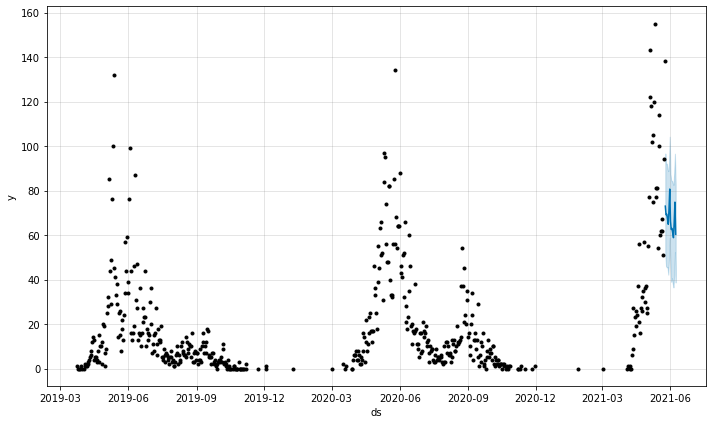

In [545]:
fig1 = model.plot(forecast)

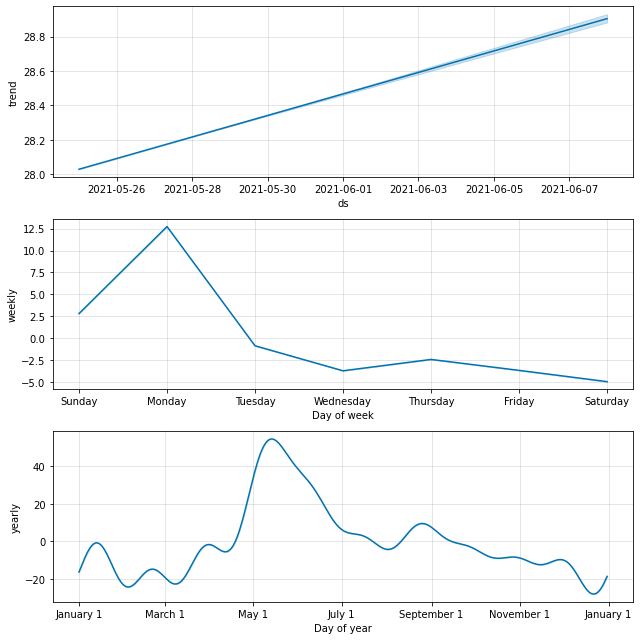

In [546]:
fig2 = model.plot_components(forecast)

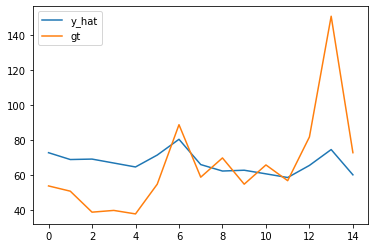

In [558]:
plt.plot(forecast['yhat'].values, label='y_hat')
plt.plot(X_test_chel['cnt_type_1'].values, label='gt')
plt.legend()